# Preprocessing

## Repartition

In [21]:
import pandas as pd
df = pd.read_csv('../train_labels.csv', header=None, names=['filename', 'label'])

In [22]:
category_names = {
    0: 'Animation',
    1: 'Horror',
    2: 'Blockbuster',
    3: 'Comedy',
    4: 'Arthouse',
}

df['category'] = df['label'].map(category_names)
repartition = pd.DataFrame({
    'count': df['category'].value_counts(),
    'percentage': (df['category'].value_counts(normalize=True) * 100).round(2),
})
repartition

,count,percentage
category,,
Arthouse,1160,30.74
Comedy,841,22.29
Animation,812,21.52
Blockbuster,791,20.96
Horror,169,4.48


In [23]:
import os
import cv2
import numpy as np

TRAIN_DIR = '../train'

def is_truncated(path):
    """JPEG incomplet : le fichier ne se termine pas par le marqueur EOI (FFD9)."""
    with open(path, 'rb') as f:
        f.seek(-2, 2)
        return f.read(2) != b'\xff\xd9'

def image_scores(path, target_height=512):
    img = cv2.imread(path)
    if img is None:
        return np.nan, np.nan
    h, w = img.shape[:2]
    img = cv2.resize(img, (int(w * target_height / h), target_height), interpolation=cv2.INTER_AREA)

    # flou : variance du Laplacien, plus c'est bas plus c'est flou
    blur = cv2.Laplacian(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), cv2.CV_64F).var()

    # fond uni : fraction de pixels dans la couleur dominante (histogramme 8x8x8)
    codes = (img // 32).astype(np.int32)
    codes = codes[:, :, 0] * 64 + codes[:, :, 1] * 8 + codes[:, :, 2]
    uniform = np.bincount(codes.ravel(), minlength=512).max() / codes.size
    return blur, uniform

rows = []
for name in df['filename']:
    path = os.path.join(TRAIN_DIR, name)
    blur, uniform = image_scores(path)
    rows.append((name, blur, uniform, is_truncated(path)))

scores = pd.DataFrame(rows, columns=['filename', 'blur_score', 'uniform_score', 'truncated'])

# on repart toujours des colonnes d'origine -> cellule ré-exécutable sans suffixes _x / _y
base_cols = [c for c in ['filename', 'label', 'category'] if c in df.columns]
df = df[base_cols].merge(scores, on='filename')

print(f"{df['truncated'].sum()} images tronquées sur {len(df)}")
df[['blur_score', 'uniform_score']].describe()


28 images tronquées sur 3773


,blur_score,uniform_score
count,3773.000000,3773.000000
mean,1647.851484,0.273180
std,1042.447779,0.184984
min,23.344668,0.032877
25%,920.234934,0.130081
50%,1457.691759,0.217331
75%,2144.149523,0.372634
max,11440.556032,0.981007


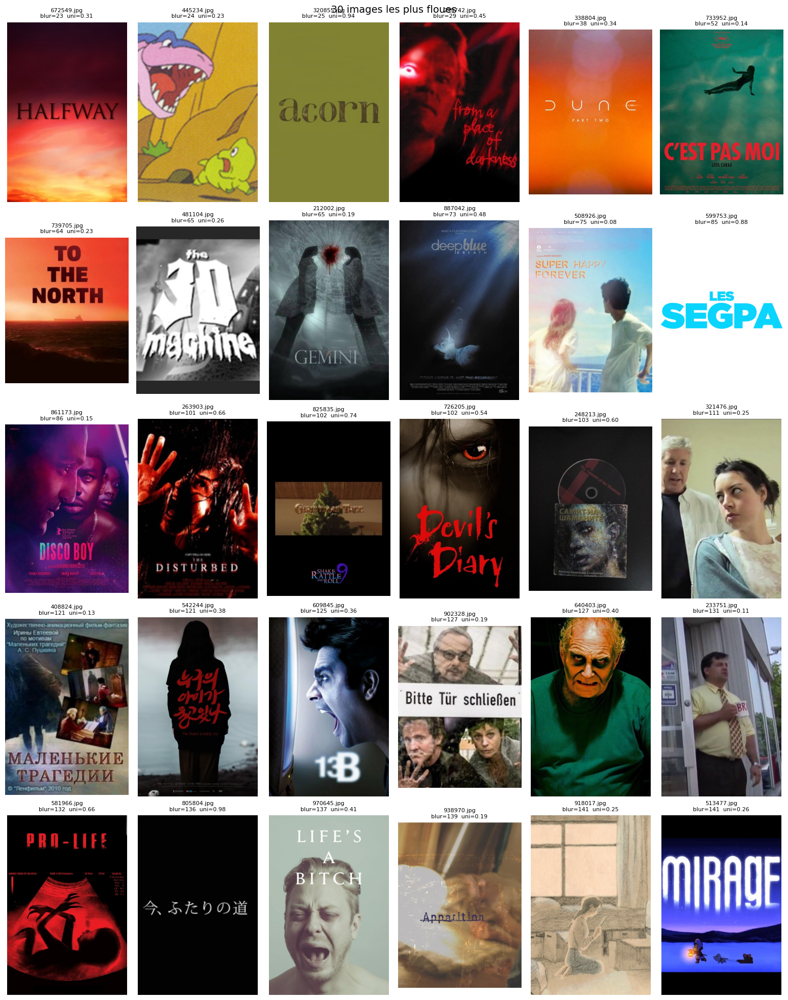

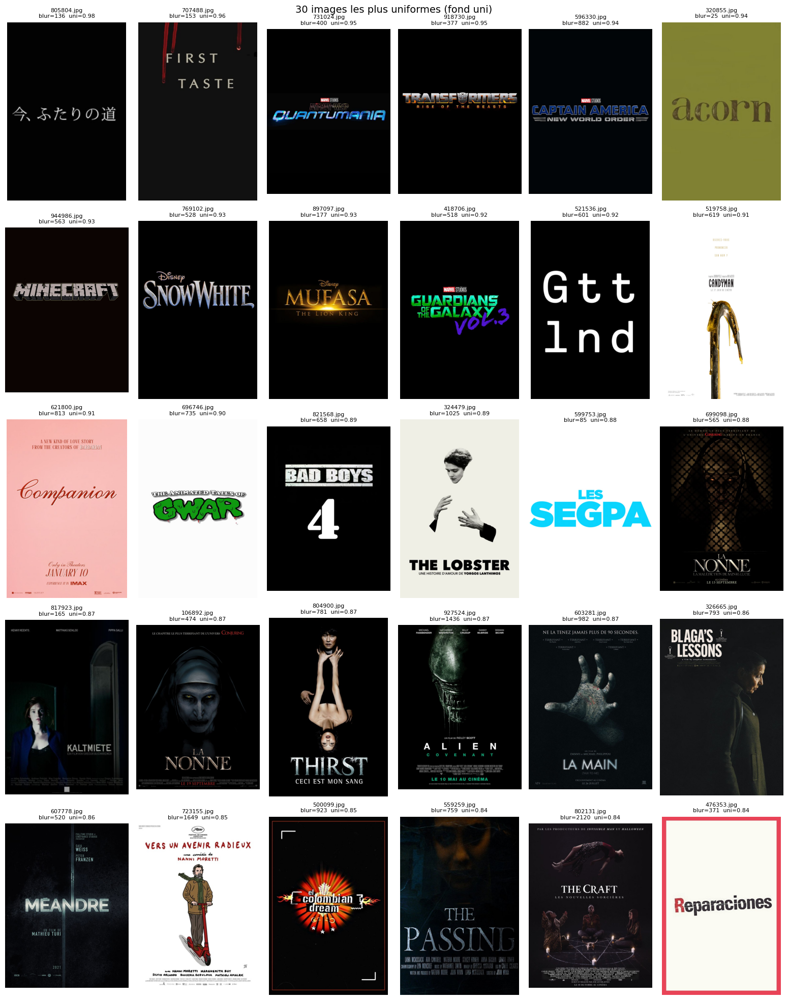

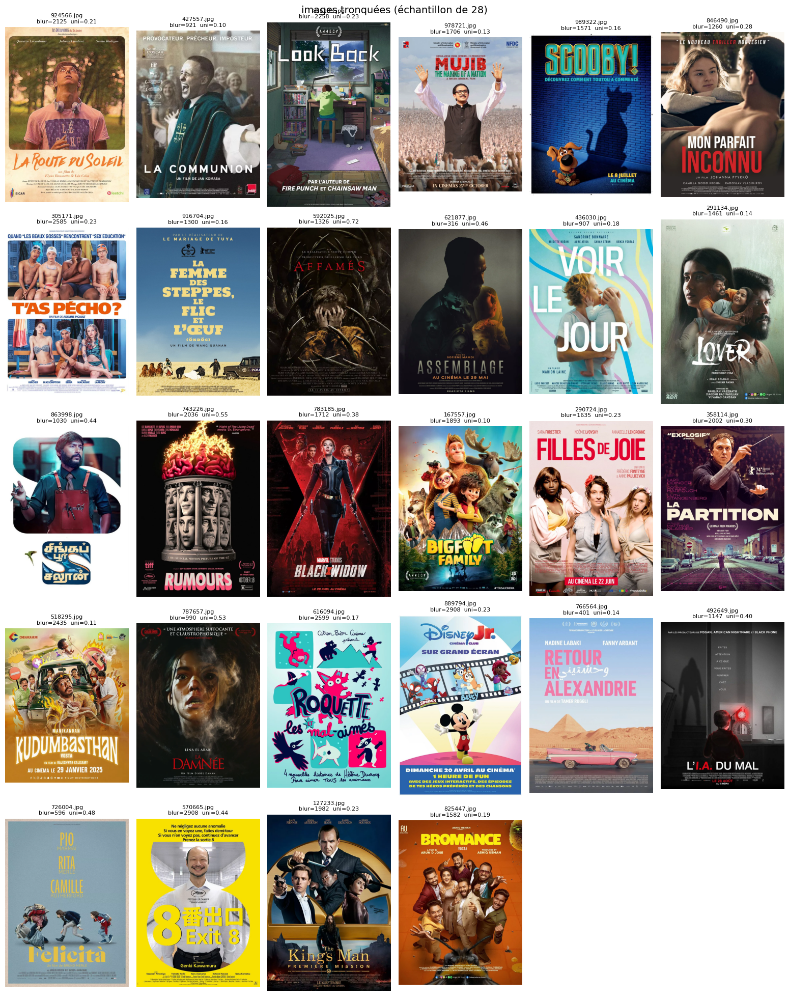

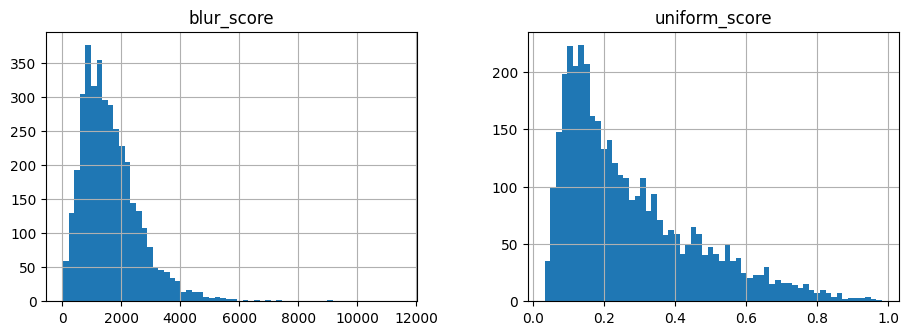

In [24]:
import matplotlib.pyplot as plt

N = 30  # nombre d'images affichées par catégorie

def show_grid(sample, title, cols=6):
    n_rows = int(np.ceil(len(sample) / cols))
    fig, axes = plt.subplots(n_rows, cols, figsize=(2.6 * cols, 4 * n_rows), squeeze=False)
    fig.suptitle(title, fontsize=14)
    for ax, (_, r) in zip(axes.ravel(), sample.iterrows()):
        img = cv2.imread(os.path.join(TRAIN_DIR, r['filename']))
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(f"{r['filename']}\nblur={r['blur_score']:.0f}  uni={r['uniform_score']:.2f}", fontsize=8)
    for ax in axes.ravel():
        ax.axis('off')
    plt.tight_layout()
    plt.show()

show_grid(df.nsmallest(N, 'blur_score'), f'{N} images les plus floues')
show_grid(df.nlargest(N, 'uniform_score'), f'{N} images les plus uniformes (fond uni)')
show_grid(df[df['truncated']].head(N), f"images tronquées (échantillon de {df['truncated'].sum()})")

df[['blur_score', 'uniform_score']].hist(bins=60, figsize=(11, 3.5), layout=(1, 2))
plt.show()


924566, 427557, 855185, 978721, 989322, 846490, 305171, 916704, 592025, 621877, 436030, 291134, 863998, 743226, 783185, 167557, 290724, 358114, 518295, 787657, 616094, 889794, 766564, 492649


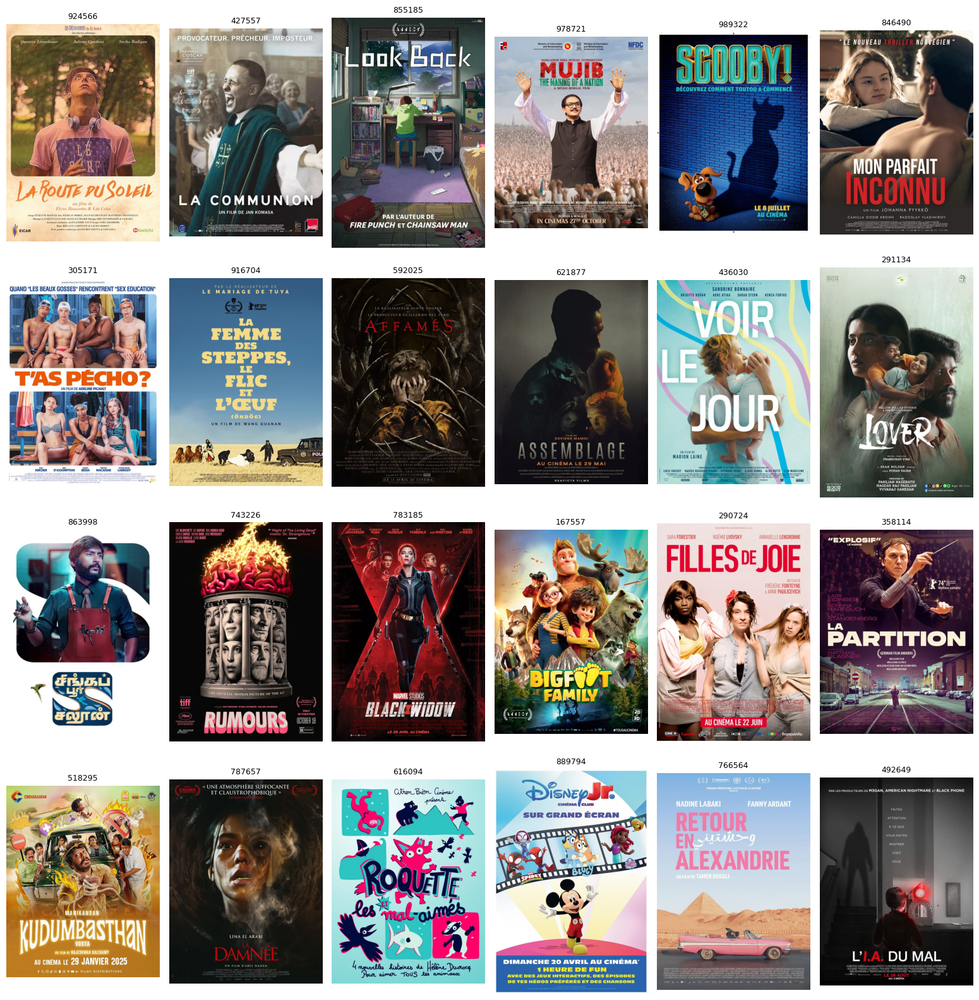

726004, 570665, 127233, 825447


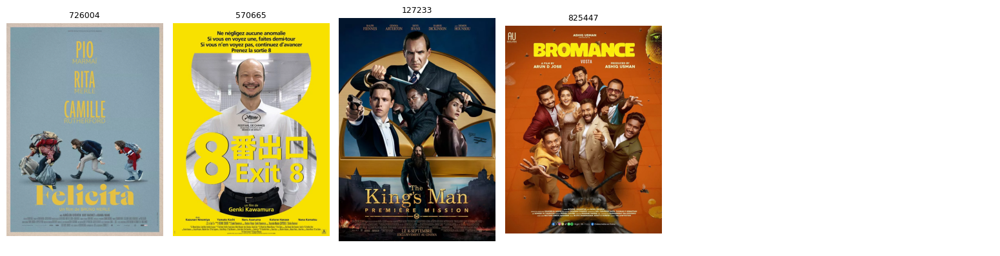

In [25]:
import matplotlib.pyplot as plt

def show_ids(ids, cols=6, width=2.6):
    """Affiche les images données par leur id (sans .jpg) + la liste en texte copiable."""
    ids = list(ids)
    print(', '.join(str(i) for i in ids))

    n_rows = int(np.ceil(len(ids) / cols))
    fig, axes = plt.subplots(n_rows, cols, figsize=(width * cols, width * 1.55 * n_rows), squeeze=False)
    for ax, img_id in zip(axes.ravel(), ids):
        img = cv2.imread(os.path.join(TRAIN_DIR, f'{img_id}.jpg'))
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(str(img_id), fontsize=9)
    for ax in axes.ravel():
        ax.axis('off')
    plt.tight_layout()
    plt.show()


truncated_ids = df.loc[df['truncated'], 'filename'].str.replace('.jpg', '', regex=False).tolist()

for start in range(0, len(truncated_ids), 24):
    show_ids(truncated_ids[start:start + 24])
